# Obtain Data

Before I process or change the data, let’s just get an idea of what we are dealing with. \
The very first step of a data science project is straightforward. We obtain the data that we need from available data sources. For this project I have the King County House Sales dataset. The dataset can be found in the file `"kc_house_data.csv"`

### About this Dataset
This dataset contains house sale prices for King County, which includes Seattle. Dataset includes homes sold between May 2014 and May 2015.

***There are a some of libraries that are used in this step. They are imported and aliased below.***

In [1]:
# import all libraries for work 
import os # for work with path/dir
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

### First view of Data. 
***Read in the dataset from file and start to investigate basic things***

In [2]:
# read information from csv file
pd.set_option('display.max_columns', 22)
data = pd.read_csv('./data/kc_house_data.csv') 
# Lets's look closer to our data
data

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,3,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [3]:
#spesial data frame for all interesting facts
remarks = pd.DataFrame(columns=['column_name','problem','solution'])

In [4]:
#Check shape: rows and columns
data.shape

(21597, 21)

In [5]:
#carto-positron
fig = px.scatter_mapbox(data, lat="lat", lon="long", color="price", hover_name="price", hover_data=["bedrooms", "bathrooms"],
                        color_discrete_sequence=["blue"], size_max=15, zoom=8, width=900, height=600, 
                        title =  '<b>Map of area, check location </b>')
fig.update_layout(mapbox_style="stamen-watercolor")
fig.show(config={'scrollZoom': False})

In [6]:
# create a map of area, where houses from data set located
fig = px.scatter_mapbox(data, lat="lat", lon="long", color="price", hover_name="price", hover_data=["bedrooms", "bathrooms"],
                        color_discrete_sequence=["green"], size_max=15, zoom=8, width=900, height=600, 
                        title =  '<b>Map of area, check location </b>')
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

In [7]:
import folium # for map visualization
from folium import plugins

houses_map = folium.Map(location = [data['lat'].mean(), data['long'].mean()], zoom_start = 10)
lat_long_data = data[['lat', 'long']].values.tolist()
h_cluster = folium.plugins.FastMarkerCluster(lat_long_data).add_to(houses_map)

houses_map

In [8]:
import numpy as np

zipcode_data = data.groupby('zipcode').aggregate(np.mean)
zipcode_data.reset_index(inplace=True)

In [9]:
data['count'] = 1
count_house_zipcode = data.groupby('zipcode').sum()
count_house_zipcode.reset_index(inplace=True)
count_house_zipcode = count_house_zipcode[['zipcode', 'count']]
data.drop(['count'], axis = 1, inplace=True)

In [10]:
data

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,3,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


In [11]:
zipcode_data = zipcode_data.join(count_house_zipcode.set_index('zipcode'), on='zipcode')

In [12]:
zipcode_data

,zipcode,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,count
0,98001,4.651274e+09,2.811949e+05,3.393352,2.011773,1903.783934,14967.002770,1.430748,0.000000,0.094708,3.335180,7.296399,1723.756233,1980.867036,28.038732,47.309106,-122.270704,1830.099723,11218.875346,361
1,98002,4.850894e+09,2.342840e+05,3.326633,1.839196,1627.743719,7517.633166,1.334171,0.000000,0.010050,3.743719,6.693467,1522.537688,1967.773869,60.212121,47.308780,-122.213357,1479.030151,7585.482412,199
2,98003,4.674182e+09,2.941113e+05,3.357143,2.047321,1928.882143,10603.096429,1.310714,0.000000,0.214286,3.371429,7.542857,1663.550000,1976.885714,16.641667,47.315741,-122.310054,1876.196429,9746.178571,280
3,98004,4.394237e+09,1.356524e+06,3.854890,2.527603,2909.022082,13104.220820,1.432177,0.003534,0.306962,3.495268,8.687697,2419.842271,1971.470032,213.759542,47.616183,-122.205189,2674.700315,12805.022082,317
4,98005,4.961872e+09,8.102897e+05,3.851190,2.424107,2656.803571,19928.785714,1.279762,0.000000,0.095238,3.696429,8.488095,2160.196429,1969.744048,57.985507,47.611532,-122.167268,2567.863095,18367.773810,168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,98177,3.934998e+09,6.764194e+05,3.396078,2.100000,2323.333333,11904.403922,1.276471,0.004255,0.814961,3.494118,7.976471,1836.713725,1960.843137,155.892683,47.742381,-122.369282,2186.196078,11690.239216,255
66,98178,4.291467e+09,3.106128e+05,3.305344,1.731870,1729.351145,8309.122137,1.185115,0.038627,0.534351,3.320611,6.816794,1325.992366,1955.232824,85.322275,47.499118,-122.246969,1648.816794,8149.641221,262
67,98188,4.481851e+09,2.890783e+05,3.433824,1.863971,1802.772059,10126.080882,1.227941,0.000000,0.147059,3.330882,7.036765,1492.154412,1965.507353,53.178571,47.447310,-122.280993,1636.279412,9752.801471,136
68,98198,5.152291e+09,3.028967e+05,3.182143,1.788393,1745.360714,10525.978571,1.225000,0.037190,0.597122,3.442857,7.103571,1476.253571,1966.735714,75.991525,47.390788,-122.315743,1711.571429,9478.596429,280


In [13]:
zipcode_data['zipcode'] = zipcode_data['zipcode'].astype(str)

In [14]:
def show_zipcode_map(col, bins):
    geo_path = './zipcode_king_county.geojson'
    zipcode = folium.Map(location=[zipcode_data['lat'].mean(), zipcode_data['long'].mean()], zoom_start=9)
    zipcode.choropleth(
        geo_data=geo_path, 
        data=zipcode_data, 
        columns=['zipcode', col],
        key_on='feature.properties.ZCTA5CE10',
        fill_color='OrRd',
        fill_opacity=0.6, 
        line_opacity=0.2,
        bins=bins) # bins로 조절!
#     zipcode.save(col + '.html')
    return zipcode

In [15]:
import geopandas as gpd
data['zipcode'] = data['zipcode'].astype(str)

def show_zipcode_map1(col, bins):
    #geo_path = './zipcode_king_county.geojson'
    geosjon_file = 'zipcode_king_county.geojson'
    tracts = gpd.read_file(geosjon_file)
    
    
    
    king_map = folium.Map(location=[47.5480, -121.9836],zoom_start=9) 
    
    folium.GeoJson(tracts).add_to(king_map)
    
    #pickup_by_censustract['zipcode'].astype(str)
    folium.Choropleth(
    geo_data=tracts,
    name="choropleth",
    data=data,
    columns=['zipcode', col],
    key_on="feature.properties.geoid10",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Ride-hailing demand").add_to(king_map)

    folium.LayerControl().add_to(king_map)
    
    return king_map

In [16]:
show_zipcode_map('count', 9)

/Users/marigaldina/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



In [17]:
show_zipcode_map('price', 9)

In [18]:
dataset = pd.read_csv('./data/kc_house_data.csv') 
# Set zipcode type to string (folium)
dataset['zipcode'] = dataset['zipcode'].astype('str')
# get the mean value across all data points
zipcode_data = dataset.groupby('zipcode').aggregate(np.mean)
zipcode_data.reset_index(inplace = True)

In [19]:
# count number of houses grouped by zipcode
dataset['count'] = 1
temp = dataset.groupby('zipcode').sum()
temp.reset_index(inplace = True)
temp = temp[['zipcode', 'count']]
zipcode_data = pd.merge(zipcode_data, temp, on='zipcode')
# drop count from org dataset
dataset.drop(['count'], axis = 1, inplace = True)

In [20]:
import json
# Get geo data file path
geo_data_file = os.path.join('zipcode_king_county.geojson')
# load GeoJSON
with open(geo_data_file, 'r') as jsonFile:
    geo_data = json.load(jsonFile)
    
tmp = geo_data
# remove ZIP codes not in geo data
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZCTA5CE10'] in list(zipcode_data['zipcode'].unique()):
        geozips.append(tmp['features'][i])
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': ')))


6701381

In [21]:
def map_feature_by_zipcode(zipcode_data, col):
    """
    Generates a folium map of Seattle
    :param zipcode_data: zipcode dataset
    :param col: feature to display
    :return: m
    """

    # read updated geo data
    king_geo = "cleaned_geodata.json"

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[47.35, -121.9], zoom_start=9,
                   detect_retina=True, control_scale=False)

    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data=zipcode_data,
        # col: feature of interest
        columns=['zipcode', col],
        key_on='feature.properties.ZCTA5CE10',
        fill_color='YlGn',
        fill_opacity=0.9,
        line_opacity=0.2,
        legend_name='house ' + col
    )

    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

In [22]:
map_feature_by_zipcode(zipcode_data, 'count')

In [78]:
map_feature_by_zipcode(zipcode_data, 'price')

/Users/marigaldina/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



### Let's check statistical infromation with we should work.

In [23]:
#view some basic statistical information 
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,47.777600,-121.315000,6210.000000,871200.000000


In [24]:
# checkin information about columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null object
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(10), object(3)
memory usage: 3.5+ MB


In [25]:
# checking if any value is NaN 
data.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

The short description of the data set shows us that it contains various data types and null values. It’s important to remember this as we process the data and build our model.

### We need to study data and its relationships, let's look at what the data in the columns means.

In [26]:
# iterating the columns 
for col in data.columns: 
    print(col)

id
date
price
bedrooms
bathrooms
sqft_living
sqft_lot
floors
waterfront
view
condition
grade
sqft_above
sqft_basement
yr_built
yr_renovated
zipcode
lat
long
sqft_living15
sqft_lot15



What all columns mean?

### Column Names and descriptions for Kings County Data Set
1. **id** - unique identified for a house
2. **Date** - date house was sold
3. **Price** -  price is prediction target
4. **bedrooms** -  Number of Bedrooms/House
5. **bathrooms** -  Number of bathrooms/bedrooms
6. **sqft_living** - square footage of the home
7. **sqft_lot** - square footage of the lot
8. **floors** - Total floors (levels) in house
9. **waterfront** - House which has a view to a waterfront
10. **view** - Has been viewed
11. **condition** - How good the condition is ( Overall )
12. **grade** - overall grade given to the housing unit, based on King County grading system
13. **sqft_above** - square footage of house apart from basement
14. **sqft_basement** - square footage of the basement
15. **yr_built** - Built Year
16. **yr_renovated** - Year when house was renovated
17. **zipcode** - zip
18. **lat** - Latitude coordinate
19. **long** - Longitude coordinate
20. **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
21. **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

****
###  About column *id*:

In [27]:
data['id'].count()

21597

In [28]:
# how many duplicates 
data.duplicated(subset='id').sum()

177

In [29]:
remarks.loc[0] = ('id', 'duplicates', 'check one more times, whta is that mean')

In our data set we have **21597** rows, some of the `id` meet more then once (**177** have duplicates).
****
### About column *date*:
When we check information about columns, we found that ot has object type.

In [30]:
data['date'].value_counts()

6/23/2014    142
6/25/2014    131
6/26/2014    131
7/8/2014     127
4/27/2015    126
            ... 
1/17/2015      1
5/17/2014      1
11/2/2014      1
8/30/2014      1
7/27/2014      1
Name: date, Length: 372, dtype: int64

When I see this information, I can't say anything. Then I change the dataframe a little for better look.

In [31]:
data['date'] = pd.to_datetime(data['date'])
data['year'],data['month'],data['day'] = data['date'].dt.year, data['date'].dt.month, data['date'].dt.dayofweek
data['year'].value_counts()

2014    14622
2015     6975
Name: year, dtype: int64

How we know from the begining - we have information about two years.

In [32]:
data['month'].value_counts()

5     2414
4     2229
7     2211
6     2178
8     1939
10    1876
3     1875
9     1771
12    1470
11    1409
2     1247
1      978
Name: month, dtype: int64

Look like all month have atable sales. What about day of the week?

In [33]:
data['day'].value_counts()

1    4710
2    4600
0    4097
3    3989
4    3684
5     287
6     230
Name: day, dtype: int64

In [34]:
remarks.loc[1] = ('date', 'type of column is object', 'change data type to datatime for convenience of work')

Very intresting situation: **Saturday and Sunday bad day for deal.**
****
### About column *price* on math language:

In [35]:
# check deneral statistic information
print('Price Min:', data['price'].min())
print('Price Mean:', data['price'].mean())
print('Price Median:', data['price'].median())
print('Price Max:', data['price'].max())

Price Min: 78000.0
Price Mean: 540296.5735055795
Price Median: 450000.0
Price Max: 7700000.0


How we can see it is a HUGE gap between min and max price.

In [36]:
data['price'].std()

367368.1401013936

## Do we have houses expensive than million?

In [37]:
data.loc[data['price']>1000000].sort_values("price")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,7200,2.0,0.0,0.0,3,...,910.0,2009,0.0,98136,47.5537,-122.398,2050,6200,2015,3,3
3546,1525059112,2014-10-18,1010000.0,3,2.50,2240,41339,1.0,0.0,0.0,4,...,0.0,1945,1992.0,98005,47.6483,-122.163,2900,45738,2014,10,5
9400,1257202430,2014-06-17,1010000.0,4,3.50,2650,3060,2.0,0.0,0.0,3,...,590.0,2001,0.0,98103,47.6735,-122.332,1470,3060,2014,6,1
10653,7852160310,2014-08-14,1010000.0,4,2.75,3430,15877,1.0,0.0,4.0,3,...,0.0,2005,0.0,98065,47.5364,-121.856,4080,14577,2014,8,3
10934,2025059204,2014-07-30,1010000.0,4,2.50,2480,12688,1.0,0.0,0.0,4,...,660.0,1967,0.0,98004,47.6344,-122.205,2910,11979,2014,7,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1446,8907500070,2015-04-13,5350000.0,5,5.00,8000,23985,2.0,0.0,4.0,3,...,1280.0,2009,0.0,98004,47.6232,-122.220,4600,21750,2015,4,0
4407,2470100110,2014-08-04,5570000.0,5,5.75,9200,35069,2.0,0.0,0.0,3,...,3000.0,2001,NaN,98039,47.6289,-122.233,3560,24345,2014,8,0
9245,9208900037,2014-09-19,6890000.0,6,7.75,9890,31374,2.0,0.0,4.0,3,...,1030.0,2001,0.0,98039,47.6305,-122.240,4540,42730,2014,9,4
3910,9808700762,2014-06-11,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,3,...,2360.0,1940,2001.0,98004,47.6500,-122.214,3930,25449,2014,6,2


In [38]:
# How many houses has cost more than 1 million
((len(data[data['price']>1000000]))/len(data))*100

6.750937630226421

In [39]:
# How many houses has cost more than 1,5 million
((len(data[data['price']>1500000]))/len(data))*100

2.3892207251007087

In [40]:
# How many houses has cost more than 2 million
((len(data[data['price']>2000000]))/len(data))*100

0.9167939991665508

**In King County less than 1% of houses expensive than 2 millions**

In [41]:
remarks.loc[2] = ('price', 'big gap between min and max', 'remove super expensive homes')

In [42]:
fig = px.scatter_mapbox(data.loc[data['price']>2000000], lat="lat", lon="long", color="price", hover_name="price", hover_data=["bedrooms", "bathrooms"],
                        color_discrete_sequence=["green"], size_max=15, zoom=8, width=900, height=600, 
                        title =  '<b>Map of area with expensive houses</b>')
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

**It's look like almost all expensive houses located near water.**
****
### About column *bedrooms*
Do we have any values which  differ from average and looks weird?

In [43]:
data['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

**33** bedrooms look like a typo. Check other huge values.

In [44]:
data.loc[data['bedrooms']>=7].sort_values("bedrooms")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
556,5486800070,2014-06-20,1950000.0,7,3.50,4640,15235,2.0,NaN,1.0,3,...,1780.0,1965,2003.0,98040,47.5666,-122.231,3230,20697,2014,6,4
10264,1420700030,2014-09-22,597157.0,7,4.00,2690,10880,1.0,0.0,0.0,4,...,0.0,1960,0.0,98033,47.6787,-122.168,1840,10836,2014,9,0
10775,6411600370,2014-05-15,475000.0,7,3.50,2870,29699,1.0,0.0,0.0,3,...,1350.0,1961,NaN,98125,47.7153,-122.327,1380,7555,2014,5,3
12593,2862100366,2014-10-15,730000.0,7,2.75,3110,4400,1.5,0.0,0.0,5,...,1100.0,1914,0.0,98105,47.6684,-122.319,1240,4280,2014,10,2
12596,3812400455,2014-11-04,291000.0,7,1.00,2350,8636,1.0,0.0,0.0,3,...,800.0,1962,NaN,98118,47.5432,-122.277,1500,7366,2014,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15147,5566100170,2014-10-29,650000.0,10,2.00,3610,11914,2.0,0.0,0.0,4,...,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914,2014,10,2
19239,8812401450,2014-12-29,660000.0,10,3.00,2920,3745,2.0,0.0,0.0,4,...,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745,2014,12,0
13301,627300145,2014-08-14,1150000.0,10,5.25,4590,10920,1.0,0.0,2.0,3,...,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400,2014,8,3
8748,1773100755,2014-08-21,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,3,...,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960,2014,8,3


In [45]:
(len(data[data['bedrooms']>=7]))/len(data)*100

0.2870769088299301

In [46]:
remarks.loc[3] = ('bedrooms', '0.3% of homes have more than 7 bedrooms, 1 has 33', 'remove houses where numbers of bedroom more than 7')

Only 0.3% of houses have more than 6 bedrooms.
****
### About column *bathrooms*

In [47]:
data['bathrooms'].value_counts()

2.50    5377
1.00    3851
1.75    3048
2.25    2047
2.00    1930
1.50    1445
2.75    1185
3.00     753
3.50     731
3.25     589
3.75     155
4.00     136
4.50     100
4.25      79
0.75      71
4.75      23
5.00      21
5.25      13
5.50      10
1.25       9
6.00       6
5.75       4
0.50       4
8.00       2
6.25       2
6.75       2
6.50       2
7.50       1
7.75       1
Name: bathrooms, dtype: int64

In [48]:
data.loc[data['bathrooms']>=6].sort_values("bathrooms")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
1313,7558700030,2015-04-13,5300000.0,6,6.00,7390,24829,2.0,1.0,NaN,4,...,2390.0,1991,0.0,98040,47.5631,-122.210,4320,24619,2015,4,0
4031,685000115,2014-10-07,2150000.0,8,6.00,4340,9415,2.0,0.0,0.0,3,...,0.0,1967,0.0,98004,47.6316,-122.202,2050,9100,2014,10,1
12358,6065300370,2015-05-06,4210000.0,5,6.00,7440,21540,2.0,0.0,0.0,3,...,1890.0,2003,0.0,98006,47.5692,-122.189,4740,19329,2015,5,2
19133,3625049042,2014-10-11,3640000.0,5,6.00,5490,19897,2.0,0.0,0.0,3,...,0.0,2005,0.0,98039,47.6165,-122.236,2910,17600,2014,10,5
21034,2424059170,2015-02-19,900000.0,5,6.00,7120,40806,2.0,0.0,4.0,3,...,1640.0,2007,0.0,98006,47.5451,-122.114,3440,36859,2015,2,3
21328,8835770170,2014-08-22,1490000.0,5,6.00,6880,279968,2.0,0.0,3.0,3,...,2810.0,2007,0.0,98045,47.4624,-121.779,4690,256803,2014,8,4
14542,2303900035,2014-06-11,2890000.0,5,6.25,8670,64033,2.0,0.0,4.0,3,...,2550.0,1965,NaN,98177,47.7295,-122.372,4140,81021,2014,6,2
18288,6072800246,2014-07-02,3300000.0,5,6.25,8020,21738,2.0,0.0,0.0,3,...,0.0,2001,NaN,98006,47.5675,-122.189,4160,18969,2014,7,2
20562,424069279,2015-03-28,1180000.0,6,6.50,6260,10955,2.0,NaN,0.0,3,...,1420.0,2007,0.0,98075,47.5947,-122.039,2710,12550,2015,3,5
21490,2524069097,2014-05-09,2240000.0,5,6.50,7270,130017,2.0,0.0,0.0,3,...,850.0,2010,NaN,98027,47.5371,-121.982,1800,44890,2014,5,4


In [49]:
(len(data[data['bathrooms']>=7]))/len(data)*100

0.018521090892253553

In [50]:
remarks.loc[4] = ('bathrooms', '0.02% of homes have more than 6 bathrooms', 'remove bathrooms>=6')

Only 0.02% of houses have more than 6 bathrooms.
****
### About column ***sqft_living*** 

In [51]:
# check deneral statistic information
print('Square footage of the home Min:', data['sqft_living'].min())
print('Square footage of the home Mean:', data['sqft_living'].mean())
print('Square footage of the home Median:', data['sqft_living'].median())
print('Square footage of the home Max:', data['sqft_living'].max())

Square footage of the home Min: 370
Square footage of the home Mean: 2080.3218502569803
Square footage of the home Median: 1910.0
Square footage of the home Max: 13540


And one more time we see a HUGE gap between min and max value.

In [52]:
data.loc[data['sqft_living']>10000].sort_values("sqft_living")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
3910,9808700762,2014-06-11,7060000.0,5,4.5,10040,37325,2.0,1.0,2.0,3,...,2360.0,1940,2001.0,98004,47.6500,-122.214,3930,25449,2014,6,2
7245,6762700020,2014-10-13,7700000.0,6,8.0,12050,27600,2.5,0.0,3.0,4,...,3480.0,1910,1987.0,98102,47.6298,-122.323,3940,8800,2014,10,0
12764,1225069038,2014-05-05,2280000.0,7,8.0,13540,307752,3.0,0.0,4.0,3,...,4130.0,1999,0.0,98053,47.6675,-121.986,4850,217800,2014,5,0


In [53]:
data.loc[data['sqft_living']>5000].sort_values("sqft_living")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
3228,1924069058,2014-10-10,965000.0,4,3.25,5010,49222,2.0,0.0,0.0,5,...,1300.0,1978,0.0,98027,47.5489,-122.092,3140,54014,2014,10,4
15333,4139900050,2014-05-19,1470000.0,4,3.25,5010,34460,2.0,0.0,0.0,3,...,0.0,1988,0.0,98006,47.5469,-122.127,4760,34460,2014,5,0
21294,2154970020,2014-07-03,2350000.0,4,4.25,5010,19412,2.0,0.0,1.0,3,...,1010.0,2014,0.0,98040,47.5455,-122.211,3820,17064,2014,7,3
18467,4389201095,2015-05-11,3650000.0,5,3.75,5020,8694,2.0,0.0,1.0,3,...,1050.0,2007,0.0,98004,47.6146,-122.213,4190,11275,2015,5,0
2862,4114601570,2014-11-18,3600000.0,3,3.25,5020,12431,2.0,1.0,4.0,3,...,1600.0,1941,2002.0,98144,47.5925,-122.287,3680,12620,2014,11,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8085,1924059029,2014-06-17,4670000.0,5,6.75,9640,13068,1.0,1.0,4.0,3,...,4820.0,1983,2009.0,98040,47.5570,-122.210,3270,10454,2014,6,1
9245,9208900037,2014-09-19,6890000.0,6,7.75,9890,31374,2.0,0.0,4.0,3,...,1030.0,2001,0.0,98039,47.6305,-122.240,4540,42730,2014,9,4
3910,9808700762,2014-06-11,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,3,...,2360.0,1940,2001.0,98004,47.6500,-122.214,3930,25449,2014,6,2
7245,6762700020,2014-10-13,7700000.0,6,8.00,12050,27600,2.5,0.0,3.0,4,...,3480.0,1910,1987.0,98102,47.6298,-122.323,3940,8800,2014,10,0


1300    138
1400    135
1440    133
1660    129
1010    129
       ... 
4970      1
2905      1
2793      1
4810      1
1975      1
Name: sqft_living, Length: 1034, dtype: int64

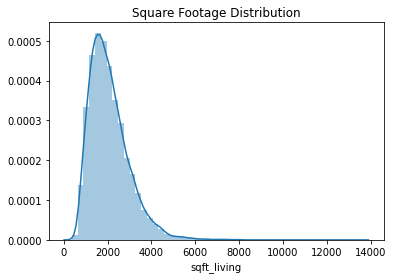

In [54]:
sns.distplot(data['sqft_living']).set_title('Square Footage Distribution')
data['sqft_living'].value_counts()

In [55]:
remarks.loc[5] = ('sqft_living', 'some of proterty too big', 'remove bathrooms>=6')

Most of homes have a footage not more 5,000 square fits
****
### About column ***sqft_lot*** 

In [56]:
# check deneral statistic information
print('Square footage of the home Min:', data['sqft_lot'].min())
print('Square footage of the home Mean:', data['sqft_lot'].mean())
print('Square footage of the home Median:', data['sqft_lot'].median())
print('Square footage of the home Max:', data['sqft_lot'].max())

Square footage of the home Min: 520
Square footage of the home Mean: 15099.408760475992
Square footage of the home Median: 7618.0
Square footage of the home Max: 1651359


5000      358
6000      290
4000      251
7200      220
7500      119
         ... 
1448        1
38884       1
17313       1
35752       1
315374      1
Name: sqft_lot, Length: 9776, dtype: int64

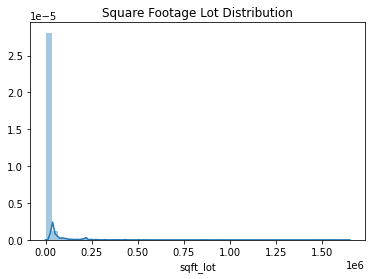

In [57]:
sns.distplot(data['sqft_lot']).set_title('Square Footage Lot Distribution')
data['sqft_lot'].value_counts()

Is some one try to sale small city? It's really odd max value!!!
****
### About column *floors*

In [58]:
data['floors'].value_counts()

1.0    10673
2.0     8235
1.5     1910
3.0      611
2.5      161
3.5        7
Name: floors, dtype: int64

Normal situation for CA suburb.
*****
### About column *waterfront*

In [59]:
data['waterfront'].value_counts()

0.0    19075
1.0      146
Name: waterfront, dtype: int64

0 == house doesn't have a view to a waterfront \
1 == house has a view to a waterfront \
Oops! We have a missing values in this column!

In [60]:
fig = px.scatter_mapbox(data.loc[data['waterfront']==1], lat="lat", lon="long", color="price", hover_name="price", hover_data=["bedrooms", "bathrooms"],
                        color_discrete_sequence=["green"], size_max=15, zoom=8, width=900, height=600, 
                        title =  '<b>Map of houses with waterfront view</b>')
fig.update_layout(mapbox_style="open-street-map")
fig.show(config={'scrollZoom': False})

There are only 146 houses, which have a waterfront view.
****
### About column *view*

In [61]:
data['view'].value_counts()

0.0    19422
2.0      957
3.0      508
1.0      330
4.0      317
Name: view, dtype: int64

In [62]:
(len(data[data['view']>0]))/len(data)*100

9.779135991109875

We don't have a lot of information about which houses have been viewed. Only 10% of houses have been viewed.
****
### About column ***condition*** 
Relative to age and grade. Coded 1-5.\
**1** - ***Poor*** - Worn out. Repair and overhaul needed on painted surfaces, roofing, plumbing, heating and numerous functional inadequacies. Excessive deferred maintenance and abuse, limited value-in-use, approaching abandonment or major reconstruction; reuse or change in occupancy is imminent. Effective age is near the end of the scale regardless of the actual chronological age.\
**2** - ***Fair*** - Badly worn. Much repair needed. Many items need refinishing or overhauling, deferred maintenance obvious, inadequate building utility and systems all shortening the life expectancy and increasing the effective age.\
**3** - ***Average*** - Some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed, along with some refinishing. All major components still functional and contributing toward an extended life expectancy. Effective age and utility is standard for like properties of its class and usage.\
**4** - ***Good*** - No obvious maintenance required but neither is everything new. Appearance and utility are above the standard and the overall effective age will be lower than the typical property.\
**5** - ***Very Good*** - All items well maintained, many having been overhauled and repaired as they have shown signs of wear, increasing the life expectancy and lowering the effective age with little deterioration or obsolescence evident with a high degree of utility.

In [63]:
data['condition'].value_counts()

3    14020
4     5677
5     1701
2      170
1       29
Name: condition, dtype: int64

In [64]:
print('Houses in very poor condition:  ', (len(data[data['condition']==1]))/len(data)*100)
print('Houses in fair condition:  ', (len(data[data['condition']==2]))/len(data)*100)
print('Houses in very good condition:  ', (len(data[data['condition']==5]))/len(data)*100)

Houses in very poor condition:   0.13427790896883826
Houses in fair condition:   0.7871463629207761
Houses in very good condition:   7.876093901930823


No more than **1 percent** of homes put up for sale in poor condition.
*****
### About column ***grade***
Represents the construction quality of improvements. Grades run from grade 1 to 13. Generally defined as:\
**1-3** -   Falls short of minimum building standards. Normally cabin or inferior structure. \
**4** -   Generally older, low quality construction. Does not meet code. \
**5** -   Low construction costs and workmanship. Small, simple design. \
**6** -   Lowest grade currently meeting building code. Low quality materials and simple designs. \
**7** -   Average grade of construction and design. Commonly seen in plats and older sub-divisions. \
**8** -   Just above average in construction and design. Usually better materials in both the exterior and interior finish work. \
**9** -   Better architectural design with extra interior and exterior design and quality. \
**10** -   Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage. \
**11** -   Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options. \
**12** -   Custom design and excellent builders. All materials are of the highest quality and all conveniences are present. \
**13** -   Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc. \

In [65]:
data['grade'].value_counts()

7     8974
8     6065
9     2615
6     2038
10    1134
11     399
5      242
12      89
4       27
13      13
3        1
Name: grade, dtype: int64

How we can see only **one** house has falls short of minimum building standards. We should closer look to this columns, because now growing demand for green homes.
****
### About column *sqft_above*

In [66]:
# check deneral statistic information
print('Square footage of house apart from basement Min:', data['sqft_above'].min())
print('Square footage of house apart from basement Mean:', data['sqft_above'].mean())
print('Square footage of house apart from basement Median:', data['sqft_above'].median())
print('Square footage of house apart from basement Max:', data['sqft_above'].max())

Square footage of house apart from basement Min: 370
Square footage of house apart from basement Mean: 1788.5968421540028
Square footage of house apart from basement Median: 1560.0
Square footage of house apart from basement Max: 9410


1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
2601      1
440       1
2473      1
2441      1
1975      1
Name: sqft_above, Length: 942, dtype: int64

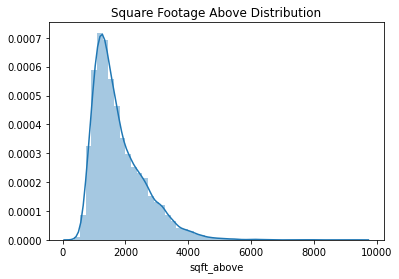

In [67]:
sns.distplot(data['sqft_above']).set_title('Square Footage Above Distribution')
data['sqft_above'].value_counts()

This columns repeat problems from column sqtf_lot.
****
### About column *sqft_basement*

In [68]:
data['sqft_basement'].value_counts()

0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1135.0        1
508.0         1
1880.0        1
1798.0        1
862.0         1
Name: sqft_basement, Length: 304, dtype: int64

In [69]:
data.loc[data['sqft_basement']=='?']

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
6,1321400060,2014-06-27,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,...,?,1995,0.0,98003,47.3097,-122.327,2238,6819,2014,6,4
18,16000397,2014-12-05,189000.0,2,1.00,1200,9850,1.0,0.0,0.0,4,...,?,1921,0.0,98002,47.3089,-122.210,1060,5095,2014,12,4
42,7203220400,2014-07-07,861990.0,5,2.75,3595,5639,2.0,0.0,0.0,3,...,?,2014,0.0,98053,47.6848,-122.016,3625,5639,2014,7,0
79,1531000030,2015-03-23,720000.0,4,2.50,3450,39683,2.0,0.0,0.0,3,...,?,2002,0.0,98010,47.3420,-122.025,3350,39750,2015,3,0
112,2525310310,2014-09-16,272500.0,3,1.75,1540,12600,1.0,0.0,0.0,4,...,?,1980,0.0,98038,47.3624,-122.031,1540,11656,2014,9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21442,3226049565,2014-07-11,504600.0,5,3.00,2360,5000,1.0,0.0,0.0,3,...,?,2008,0.0,98103,47.6931,-122.330,2180,5009,2014,7,4
21447,1760650900,2014-07-21,337500.0,4,2.50,2330,4907,2.0,0.0,0.0,3,...,?,2013,NaN,98042,47.3590,-122.081,2300,3836,2014,7,0
21473,6021503707,2015-01-20,352500.0,2,2.50,980,1010,3.0,NaN,0.0,3,...,?,2008,0.0,98117,47.6844,-122.387,980,1023,2015,1,1
21519,2909310100,2014-10-15,332000.0,4,2.50,2380,5737,2.0,0.0,0.0,3,...,?,2010,0.0,98023,47.2815,-122.356,2380,5396,2014,10,2


Based on information about dataframe columns and this query - we should change this column, and replace value `?`.
****
### About column *yr_built*

In [70]:
data['yr_built'].value_counts()

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

In [71]:
print('Min built year:', data['yr_built'].min())
print('Max built year:', data['yr_built'].max())

Min built year: 1900
Max built year: 2015


Text(0.5, 1.0, 'Build Year Distribution')

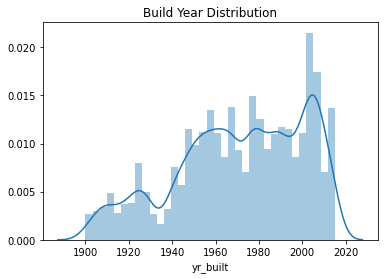

In [72]:
sns.distplot(data['yr_built']).set_title('Build Year Distribution')

We have a historical buildings!!!!
****
### About column *yr_renovated*

In [73]:
data['yr_renovated'].value_counts()

0.0       17011
2014.0       73
2003.0       31
2013.0       31
2007.0       30
          ...  
1946.0        1
1959.0        1
1971.0        1
1951.0        1
1954.0        1
Name: yr_renovated, Length: 70, dtype: int64

In [74]:
(data[data['yr_renovated']>0])

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,...,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,12,1
35,9547205180,2014-06-13,696000.0,3,2.50,2300,3060,1.5,0.0,0.0,3,...,790.0,1930,2002.0,98115,47.6827,-122.310,1590,3264,2014,6,4
95,1483300570,2014-09-08,905000.0,4,2.50,3300,10250,1.0,0.0,0.0,3,...,910.0,1946,1991.0,98040,47.5873,-122.249,1950,6045,2014,9,0
103,2450000295,2014-10-07,1090000.0,3,2.50,2920,8113,2.0,0.0,0.0,3,...,0.0,1950,2010.0,98004,47.5814,-122.196,2370,8113,2014,10,1
125,4389200955,2015-03-02,1450000.0,4,2.75,2750,17789,1.5,0.0,0.0,3,...,770.0,1914,1992.0,98004,47.6141,-122.212,3060,11275,2015,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19602,6392000625,2014-07-12,451000.0,2,1.00,900,6000,1.0,0.0,0.0,3,...,0.0,1944,2004.0,98115,47.6855,-122.289,1460,4800,2014,7,5
20041,126039256,2014-09-04,434900.0,3,2.00,1520,5040,2.0,0.0,0.0,3,...,0.0,1977,2006.0,98177,47.7770,-122.362,1860,8710,2014,9,3
20428,4305600360,2015-02-25,500012.0,4,2.50,2400,9612,1.0,0.0,0.0,3,...,1170.0,1962,2009.0,98059,47.4799,-122.127,2430,5539,2015,2,2
20431,3319500628,2015-02-12,356999.0,3,1.50,1010,1546,2.0,NaN,0.0,3,...,0.0,1971,2014.0,98144,47.5998,-122.311,1010,1517,2015,2,3


In [75]:
print('Renovated:  ', (len(data[data['yr_renovated']>0]))/len(data)*100)

Renovated:   3.4449229059591606


We have information only about 3,5% houses with renovation.

****
### About column *zipcode*

In [76]:
data['zipcode'].value_counts()

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

TypeError: unsupported operand type(s) for /: 'str' and 'int'

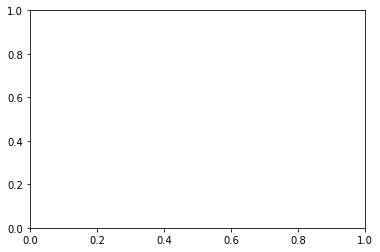

In [77]:
sns.distplot(data['zipcode']).set_title('Zipcode Distribution')

If we know ZipCode, we can check information about neighborhood.
*****
### About column *lat* and *long* 
Based on these data, I built a plot of locality at the beginning of my research.

In [ ]:
# check deneral statistic information
print('Latitude cootdinate')
print('Min:', data['lat'].min())
print('Mean:', data['lat'].mean())
print('Median:', data['lat'].median())
print('Max:', data['lat'].max())
print('------')
print('Longitude cootdinate')
print('Min:', data['long'].min())
print('Mean:', data['long'].mean())
print('Median:', data['long'].median())
print('Max:', data['long'].max())

****
### About column *sqft_living15*

In [ ]:
# check deneral statistic information
print('The square footage of interior housing living space for the nearest 15 neighbors')
print('Min:', data['sqft_living15'].min())
print('Mean:', data['sqft_living15'].mean())
print('Median:', data['sqft_living15'].median())
print('Max:', data['sqft_living15'].max())

In [ ]:
sns.distplot(data['sqft_living15']).set_title('Nearest 15 neighbors  Distribution')

****
### About column *sqft_lot15*

In [ ]:
# check deneral statistic information
print('The square footage of the land lots of the nearest 15 neighbors')
print('Min:', data['sqft_lot15'].min())
print('Mean:', data['sqft_lot15'].mean())
print('Median:', data['sqft_lot15'].median())
print('Max:', data['sqft_lot15'].max())

In [ ]:
sns.distplot(data['sqft_lot15']).set_title('Nearest 15 neighbors  Distribution')

Some one has around **13 football field** in their property. \
Let's check correlation between features on this step.

In [ ]:
data.corr()['price'].sort_values(ascending=False)

Looking at the correlation between price and the other features, one can notice that the strongest correlation is between price and **sqft_living (0.7)**, **grade (0.67)**, and **sqft_above (0.61)**. Not surprisingly, there is virtually no correlation between price and zipcode, id, and longitude. But we should check it after cleaning.

****

## Summary
### What do we have after all this steps?

* Dataset has 21,597 records in 21 columns.
* The variable we are going to predict is the price. Price is the dependent or target variable. I think we should take a closer look to features: 
    - Year when house was renovated and Built Year -- Do we pay more for older or for modern houses? 
    - Grade and condition -- What features are most important in predicting the price of a house? 
    - Square footage -- I'm not sure which of size affect more.
* Some of features have a outliers, we need a close look on them.
-------
For next scrubbing step:
1. check column `'date'`, `'sqft_basement'`
2. check duplicates `'id`
2. check missing values for `'waterfront'`,`'view'`,`'yr_renovated'`
4. check values max, min, average and peak values
5. based on map (`'lat'`,`'long'`), check outlyning objects
6. we have candidates for removal: `'day'`,`'month'`,`'id'`,`'zipcode'`

In [ ]:
#remarks